In [2]:
# Import Library

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
import scipy.stats as stats
import pylab
from sklearn.cluster import KMeans
from itertools import combinations

#**Show the data**

In [3]:
# Read_file
df = pd.read_csv('/content/city_day.csv')

In [4]:
# Show file
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [5]:
# Info for data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24933 non-null  float64
 3   PM10        18391 non-null  float64
 4   NO          25949 non-null  float64
 5   NO2         25946 non-null  float64
 6   NOx         25346 non-null  float64
 7   NH3         19203 non-null  float64
 8   CO          27472 non-null  float64
 9   SO2         25677 non-null  float64
 10  O3          25509 non-null  float64
 11  Benzene     23908 non-null  float64
 12  Toluene     21490 non-null  float64
 13  Xylene      11422 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.6+ MB


In [6]:
# Describe
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


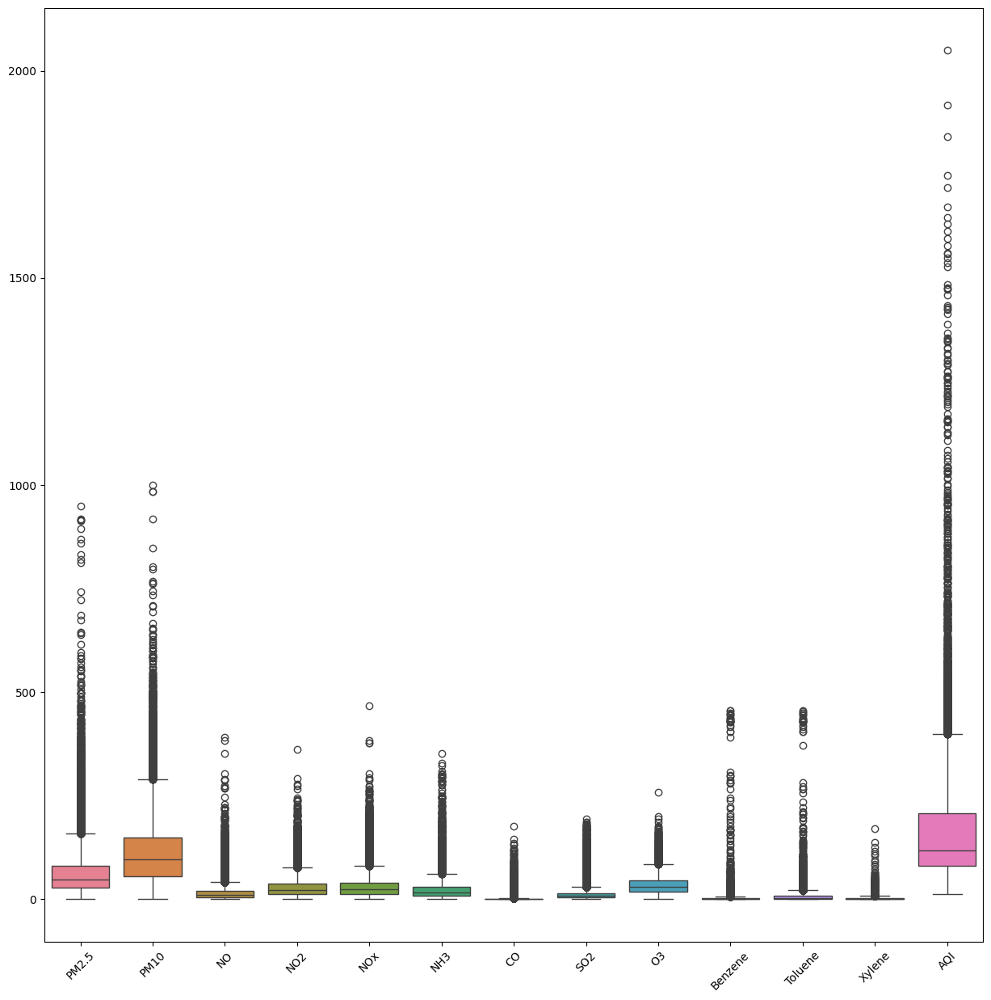

In [7]:
# Show boxplot

plt.figure(figsize=(15,15))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.show()

In [8]:
# Let's see if there missing value
for col in df.columns:
  pct_missing = np.mean(df[col].isnull())
  print('{} - {}%'.format(col, round(pct_missing*100)))

City - 0%
Date - 0%
PM2.5 - 16%
PM10 - 38%
NO - 12%
NO2 - 12%
NOx - 14%
NH3 - 35%
CO - 7%
SO2 - 13%
O3 - 14%
Benzene - 19%
Toluene - 27%
Xylene - 61%
AQI - 16%
AQI_Bucket - 16%


In [9]:
# Show type of data
df.dtypes

,0
City,object
Date,object
PM2.5,float64
PM10,float64
NO,float64
NO2,float64
NOx,float64
NH3,float64
CO,float64
SO2,float64


#**Data preprocessing**



```
# Xylene have high missing value 61% ✔
# PM10 have high missing value 38% and NH3 35% and Toluene 27% ✔
# PM2.5 ,NO ,NO2 ,NOX ,CO ,SO2 ,O3 ,Benzene ,AQI , AQI_Bucket (Less than 20%) ✔
```





```
# PM2.5,PM10,NO,NO2,NOX,NH3,CO,SO2,Benzene,Toluene and AQI have High outliers ✔
# O3 and Xylene high outliers ✔
```



In [10]:
# Xylene have high missing value 61% so deleted this column
df.drop(['Xylene'], axis=1, inplace=True)



```
# PM2.5 ,NO ,NO2 ,NOX ,CO ,SO2 ,O3 ,Benzene ,AQI ,  (Less than 20%) so fill this columns by median because we have outliers
```



In [11]:
# Fill (PM2.5 ,NO ,NO2 ,NOX ,CO ,SO2 ,O3 ,Benzene ,AQI)
col_fill = ['PM2.5','NO','NO2','NOx','CO','SO2','O3','Benzene','AQI']
for col in col_fill:
  df[col].fillna(df[col].median(), inplace=True)

<ipython-input-11-e4413b057810>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)


In [12]:
# Impute PM10,NH3,Toluene by KNN
col_knn = ['PM10','NH3','Toluene']
imputer = KNNImputer(n_neighbors=5)
df[col_knn] = imputer.fit_transform(df[col_knn])

In [13]:
for col in df.columns:
  pct_missing = np.mean(df[col].isnull())
  print('{} - {}%'.format(col, round(pct_missing*100)))

City - 0%
Date - 0%
PM2.5 - 0%
PM10 - 0%
NO - 0%
NO2 - 0%
NOx - 0%
NH3 - 0%
CO - 0%
SO2 - 0%
O3 - 0%
Benzene - 0%
Toluene - 0%
AQI - 0%
AQI_Bucket - 16%


In [14]:
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,48.57,69.040,0.92,18.22,17.15,49.178,0.92,27.64,133.36,0.00,0.02,118.0,NaN
1,Ahmedabad,2015-01-02,48.57,150.350,0.97,15.69,16.46,29.300,0.97,24.55,34.06,3.68,5.50,118.0,NaN
2,Ahmedabad,2015-01-03,48.57,233.338,17.40,19.30,29.70,38.476,17.40,29.07,30.70,6.80,16.40,118.0,NaN
3,Ahmedabad,2015-01-04,48.57,137.376,1.70,18.48,17.97,16.620,1.70,18.59,36.08,4.43,10.14,118.0,NaN
4,Ahmedabad,2015-01-05,48.57,224.086,22.10,21.42,37.76,24.676,22.10,39.33,39.31,7.01,18.89,118.0,NaN


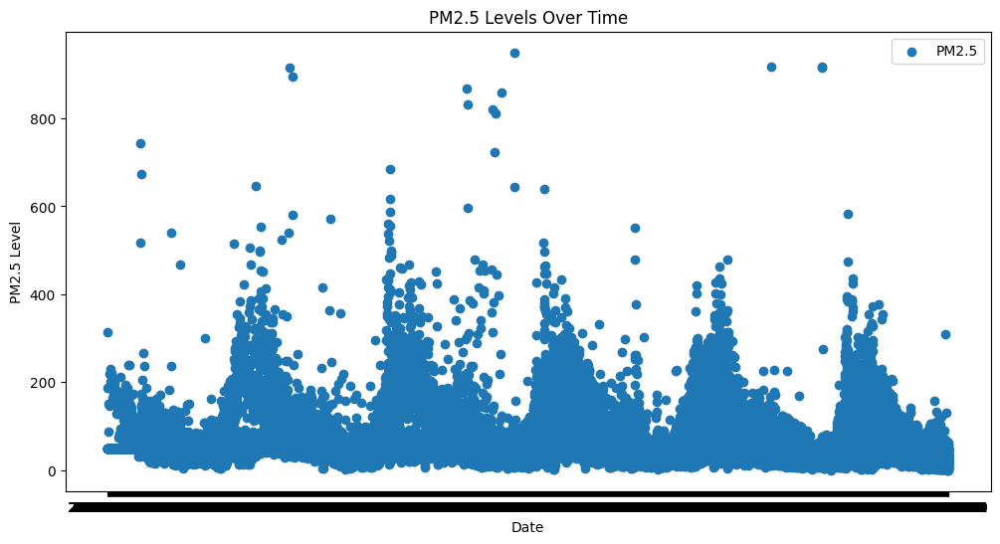

In [15]:
# Plot to check if outliers are corrects or not
plt.figure(figsize=(12,6))
plt.scatter(df['Date'], df['PM2.5'], label='PM2.5')
plt.xlabel('Date')
plt.ylabel('PM2.5 Level')
plt.title('PM2.5 Levels Over Time')
plt.legend()
plt.show()



```
# more than 290 is outliers in pm2.5
```



In [16]:
# deleted ouliers
col_out = ['PM2.5','NO','NO2','NOx','CO','SO2','O3','Benzene','AQI']
for col in df[col_out]:
  upper_limit = df[col].quantile(0.99)
  df.loc[df[col] > upper_limit, col] = upper_limit

In [17]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
count,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000
mean,63.462228,116.964628,16.279457,27.376987,30.700409,23.423825,1.936419,13.546375,33.801681,2.257712,8.543573,155.544858
std,53.085221,79.690659,19.074959,21.115948,27.441124,22.799342,4.621075,15.089132,19.346524,3.918197,17.411595,110.215288
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,13.000000
25%,32.150000,63.110000,6.210000,12.980000,14.670000,9.590000,0.540000,6.090000,20.740000,0.240000,1.160000,88.000000
50%,48.570000,101.590000,9.890000,21.690000,23.520000,19.600000,0.890000,9.160000,30.840000,1.070000,4.440000,118.000000
75%,72.450000,141.315000,17.570000,34.665000,36.015000,29.382000,1.380000,13.810000,42.730000,2.420000,8.700972,179.000000
max,298.980000,1000.000000,110.128000,114.051000,149.890000,352.890000,33.265000,98.560000,102.441000,25.837000,454.850000,606.700000




```
# PM10 NH3
```



In [18]:
numeric_cols = df.select_dtypes(include=[np.number]).columns

for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])

In [19]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
count,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000
mean,57.185400,111.789028,13.300348,26.134384,27.705994,21.729094,1.046907,11.005769,33.221570,1.682270,6.459074,145.047205
std,34.928709,63.068583,10.132122,17.419818,18.903702,15.597178,0.745663,6.823088,17.699288,1.793031,6.363893,82.612919
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,13.000000
25%,32.150000,63.110000,6.210000,12.980000,14.670000,9.590000,0.540000,6.090000,20.740000,0.240000,1.160000,88.000000
50%,48.570000,101.590000,9.890000,21.690000,23.520000,19.600000,0.890000,9.160000,30.840000,1.070000,4.440000,118.000000
75%,72.450000,141.315000,17.570000,34.665000,36.015000,29.382000,1.380000,13.810000,42.730000,2.420000,8.700972,179.000000
max,132.900000,258.622500,34.610000,67.192500,68.032500,59.070000,2.640000,25.390000,75.715000,5.690000,20.012430,315.500000


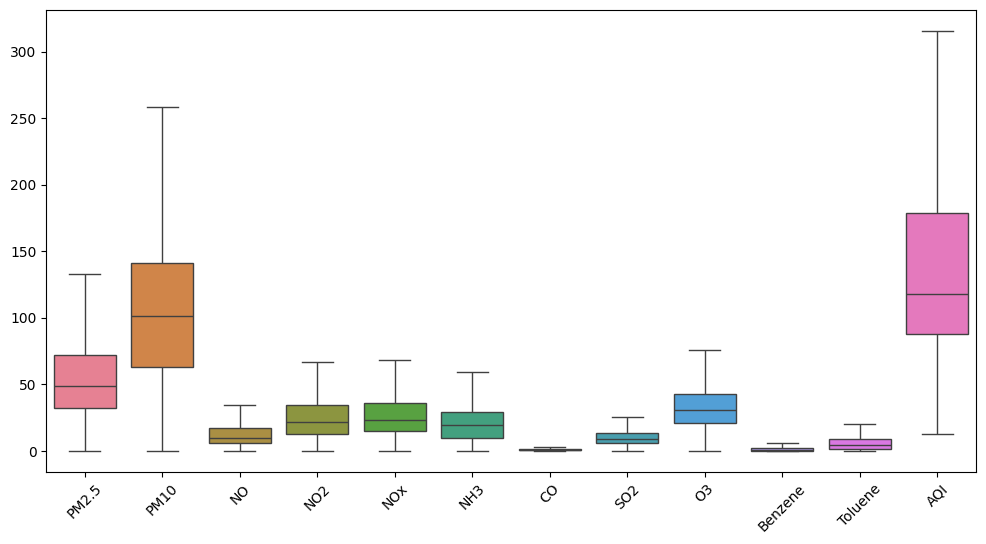

In [20]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.show()

In [21]:
df.isnull().sum()

,0
City,0
Date,0
PM2.5,0
PM10,0
NO,0
NO2,0
NOx,0
NH3,0
CO,0
SO2,0


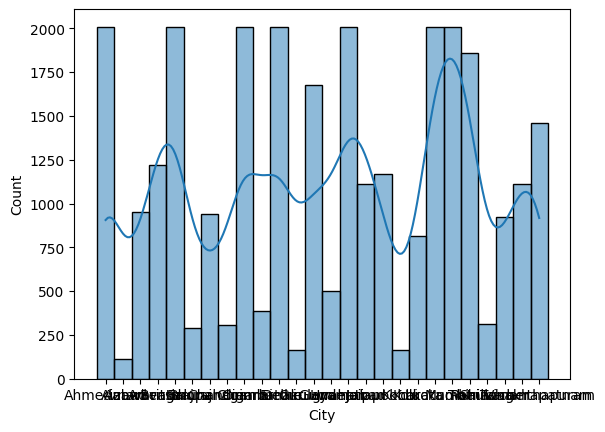

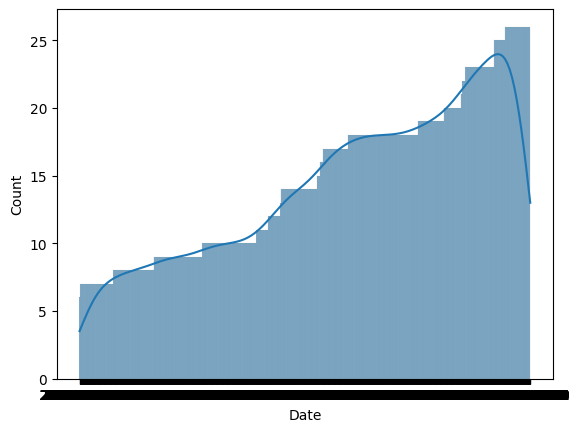

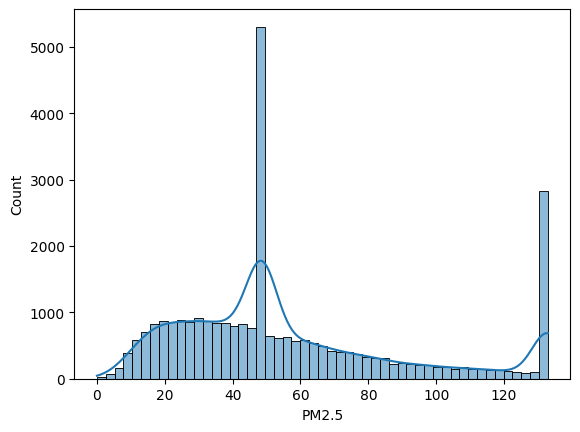

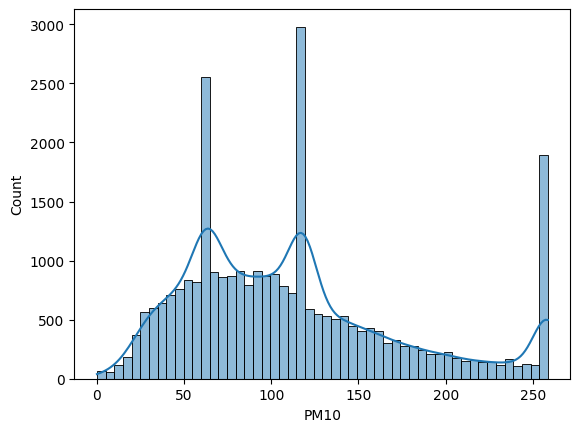

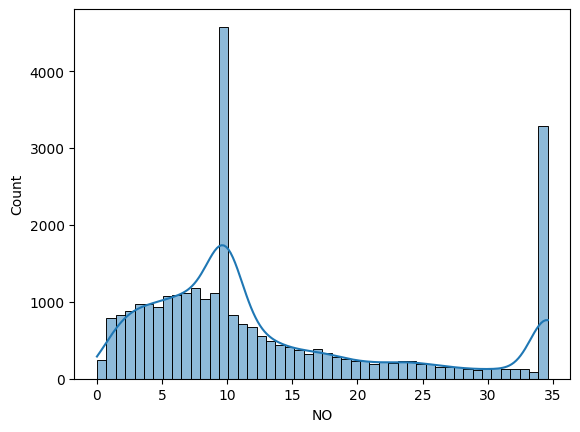

...

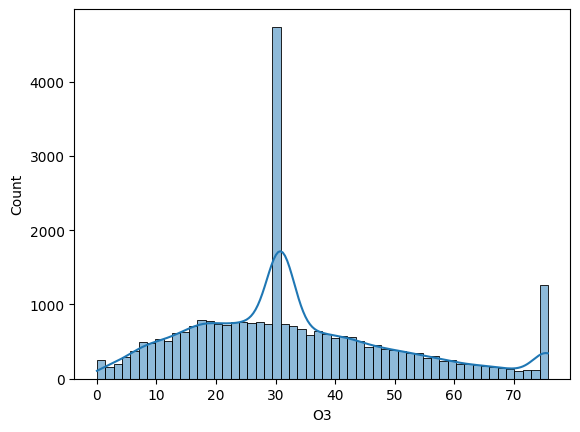

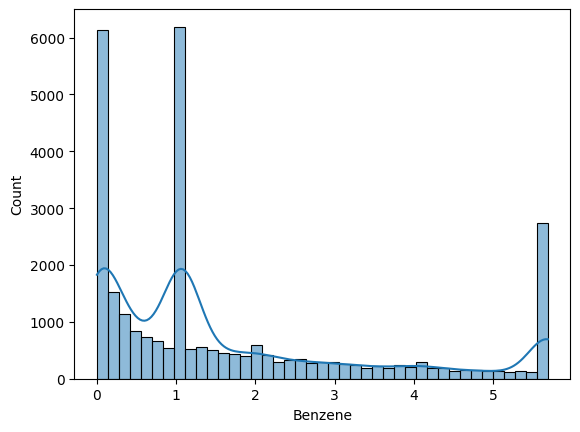

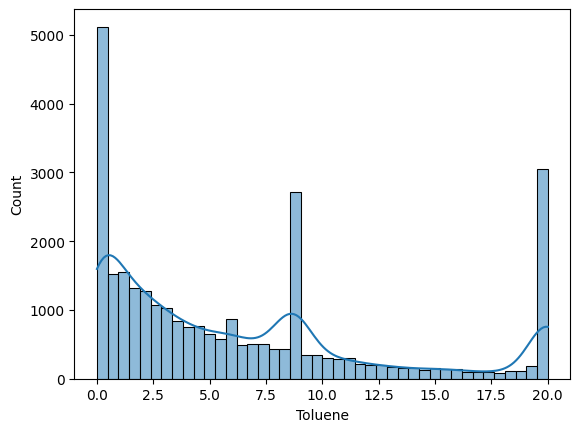

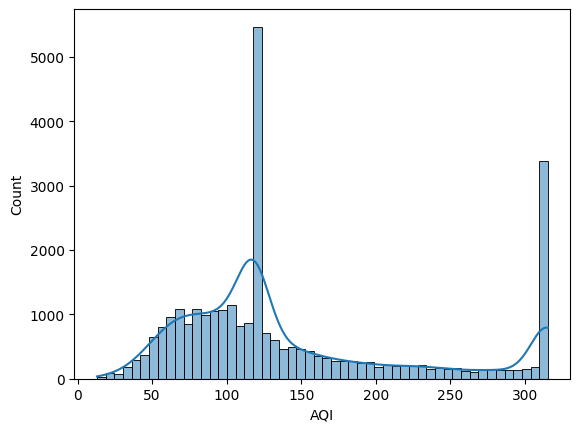

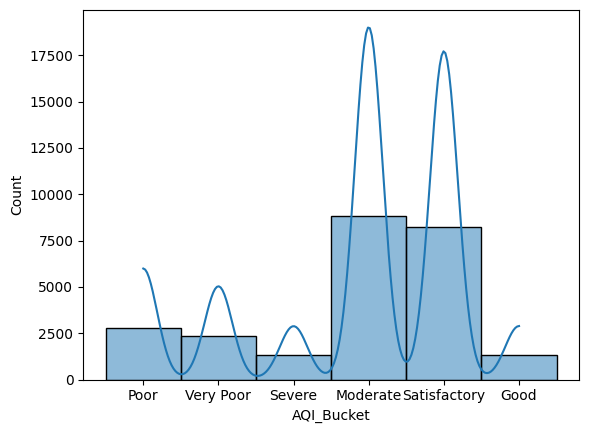

In [22]:
for col in df.columns:
  sns.histplot(df[col], kde=True)
  plt.show()



```
# Xylene have high missing value 61% ✔
# PM10 have high missing value 38% and NH3 35% and Toluene 27% ✔
# PM2.5 ,NO ,NO2 ,NOX ,CO ,SO2 ,O3 ,Benzene ,AQI , AQI_Bucket (Less than 20%) ✔
```





```
# PM2.5,PM10,NO,NO2,NOX,NH3,CO,SO2,Benzene,Toluene and AQI have High outliers ✔
# O3 and Xylene high outliers ✔
```



In [23]:
# Fill AQI_Bucket
def classify_aqi(aqi):
    if aqi <= 50:
        return "Good"
    elif aqi <= 100:
        return "Satisfactory"
    elif aqi <= 200:
        return "Moderate"
    elif aqi <= 300:
        return "Poor"
    elif aqi <= 400:
        return "Very Poor"
    else:
        return "Severe"

df['AQI_Bucket'] = df.apply(lambda row: classify_aqi(row['AQI']) if pd.isnull(row['AQI_Bucket']) else row['AQI_Bucket'], axis=1)

In [24]:
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,48.57,69.040,0.92,18.22,17.15,49.178,0.92,25.39,75.715,0.00,0.02,118.0,Moderate
1,Ahmedabad,2015-01-02,48.57,150.350,0.97,15.69,16.46,29.300,0.97,24.55,34.060,3.68,5.50,118.0,Moderate
2,Ahmedabad,2015-01-03,48.57,233.338,17.40,19.30,29.70,38.476,2.64,25.39,30.700,5.69,16.40,118.0,Moderate
3,Ahmedabad,2015-01-04,48.57,137.376,1.70,18.48,17.97,16.620,1.70,18.59,36.080,4.43,10.14,118.0,Moderate
4,Ahmedabad,2015-01-05,48.57,224.086,22.10,21.42,37.76,24.676,2.64,25.39,39.310,5.69,18.89,118.0,Moderate


In [25]:
# Change data type
df_numerized  = df
for col_num in df_numerized.columns:
  if df_numerized[col_num].dtype == 'object':
    df_numerized[col_num] = df_numerized[col_num].astype('category')
    df_numerized[col_num] = df_numerized[col_num].cat.codes
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,0,0,48.57,69.040,0.92,18.22,17.15,49.178,0.92,25.39,75.715,0.00,0.02,118.0,1
1,0,1,48.57,150.350,0.97,15.69,16.46,29.300,0.97,24.55,34.060,3.68,5.50,118.0,1
2,0,2,48.57,233.338,17.40,19.30,29.70,38.476,2.64,25.39,30.700,5.69,16.40,118.0,1
3,0,3,48.57,137.376,1.70,18.48,17.97,16.620,1.70,18.59,36.080,4.43,10.14,118.0,1
4,0,4,48.57,224.086,22.10,21.42,37.76,24.676,2.64,25.39,39.310,5.69,18.89,118.0,1


**Now stage data preprocasing is done**

#***EDA***

***Univariate Analysis***

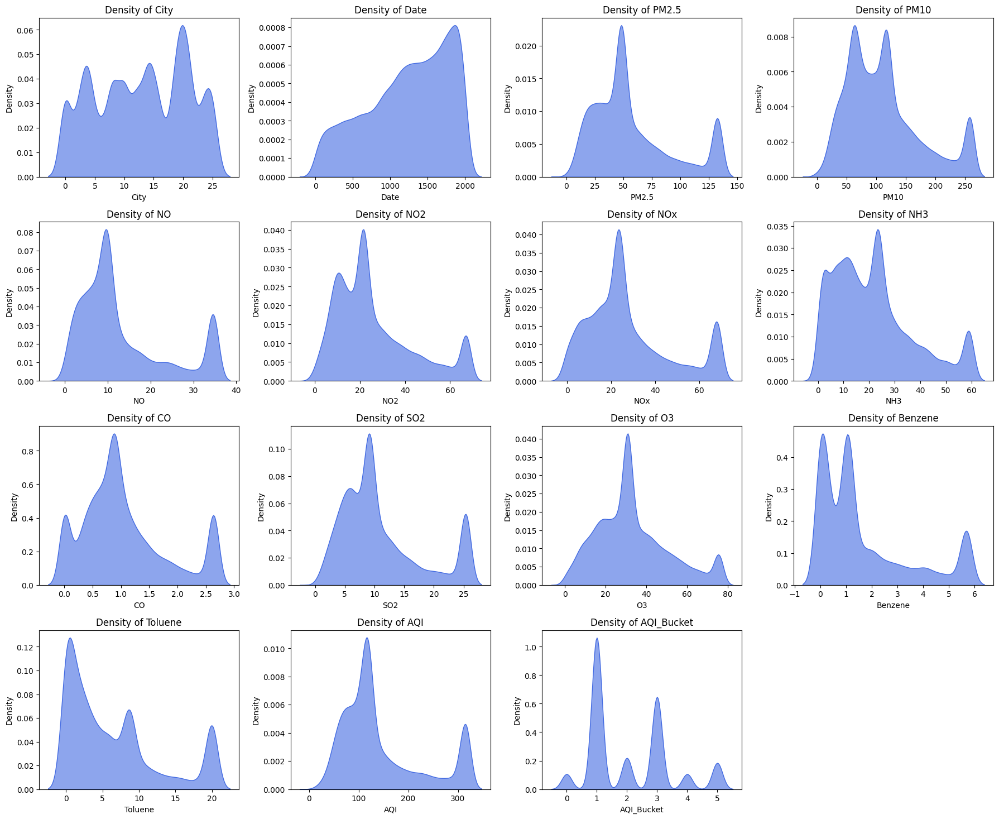

In [26]:
# KDE Plot
numeric_cols = df.select_dtypes(include=['number']).columns

plt.figure(figsize=(18, 18))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)  # تنظيم التخطيط حسب عدد المتغيرات
    sns.kdeplot(df[col], fill=True, color='royalblue', alpha=0.6)
    plt.title(f'Density of {col}')
plt.tight_layout()
plt.show()


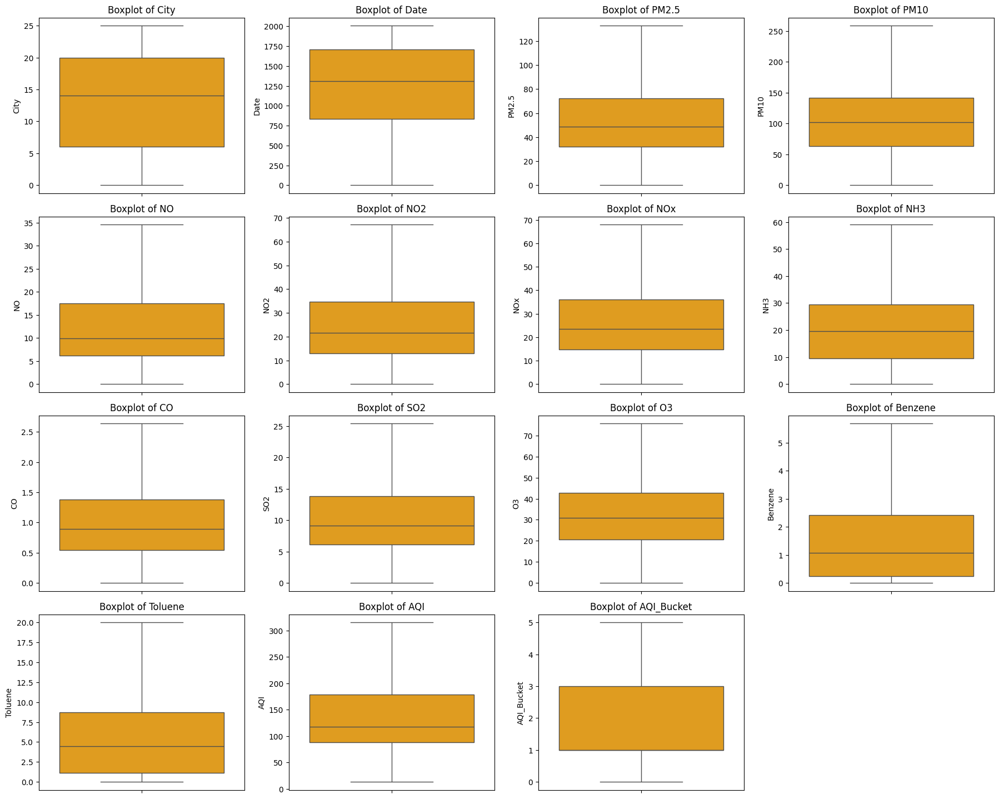

In [27]:
# Box Plot
plt.figure(figsize=(18, 18))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    sns.boxplot(y=df[col], color='orange')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()


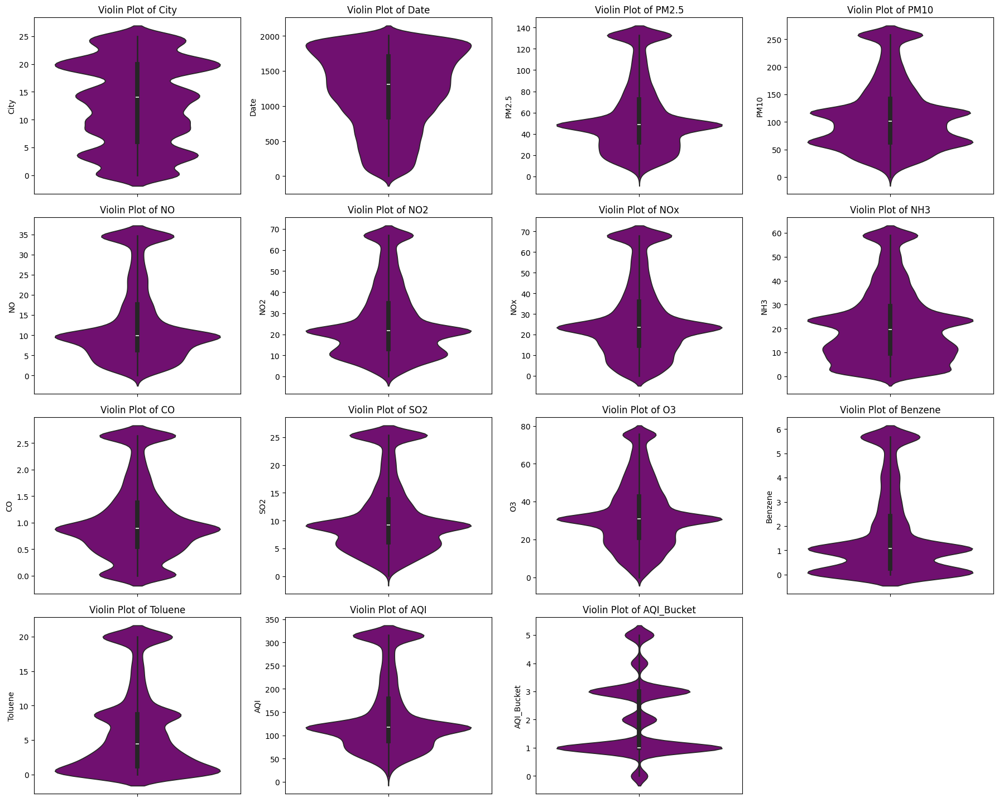

In [28]:
# Violin Plot
plt.figure(figsize=(18, 18))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    sns.violinplot(y=df[col], color='purple')
    plt.title(f'Violin Plot of {col}')
plt.tight_layout()
plt.show()

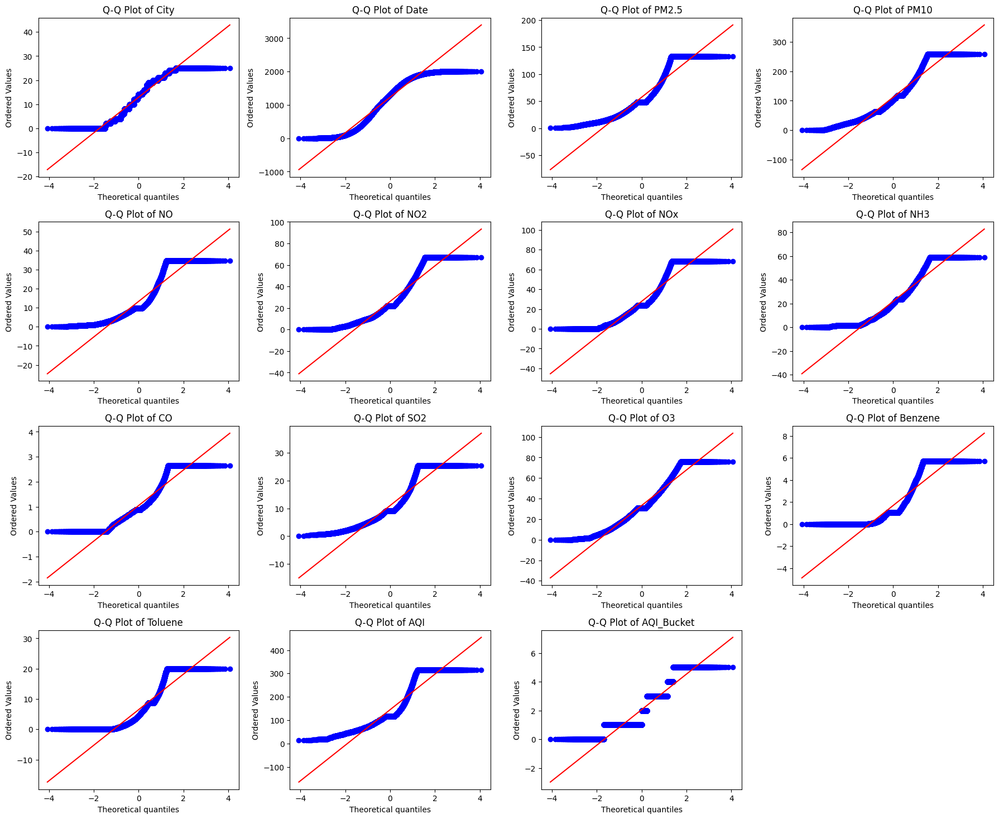

In [29]:
# Quantile-Quantile Plot (Q-Q Plot)
plt.figure(figsize=(18, 18))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    stats.probplot(df[col], dist="norm", plot=pylab)
    plt.title(f'Q-Q Plot of {col}')
plt.tight_layout()
plt.show()

***Bivariate Analysis***

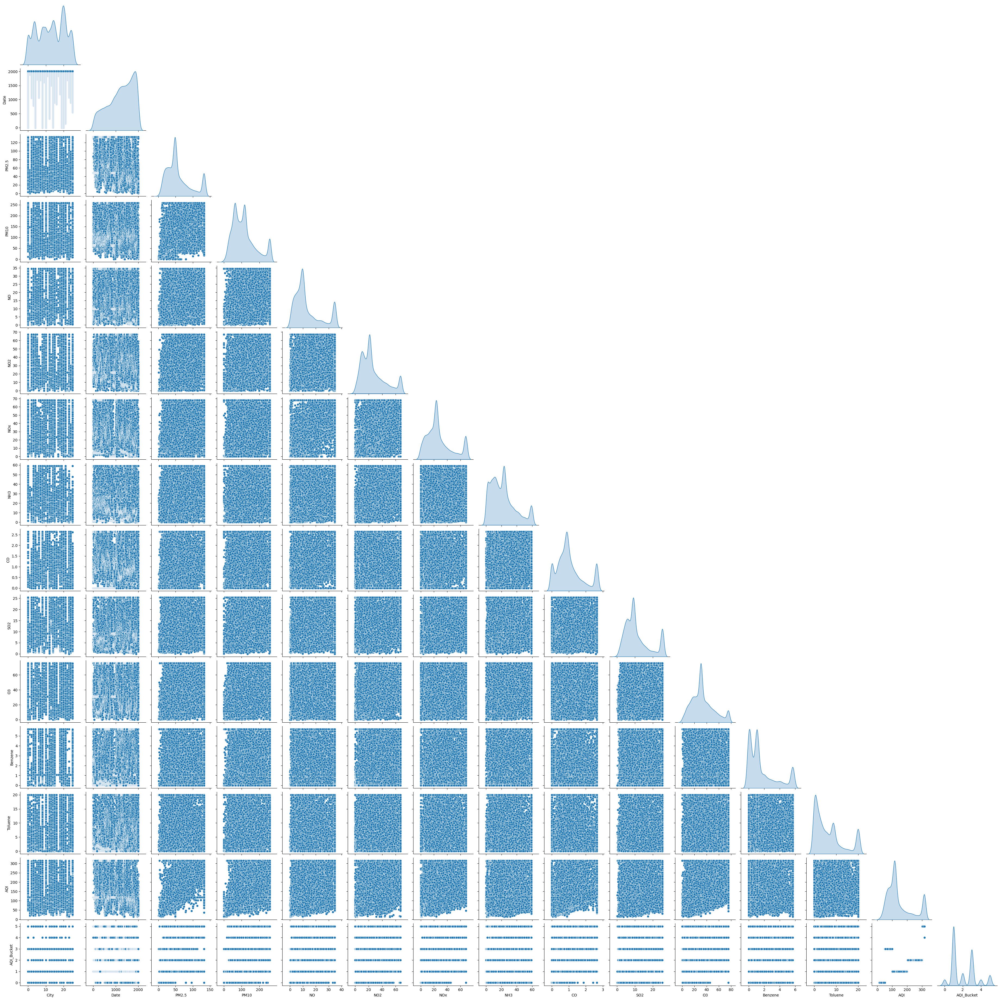

In [30]:
#Pairplot
sns.pairplot(df[numeric_cols], diag_kind='kde', corner=True)
plt.show()

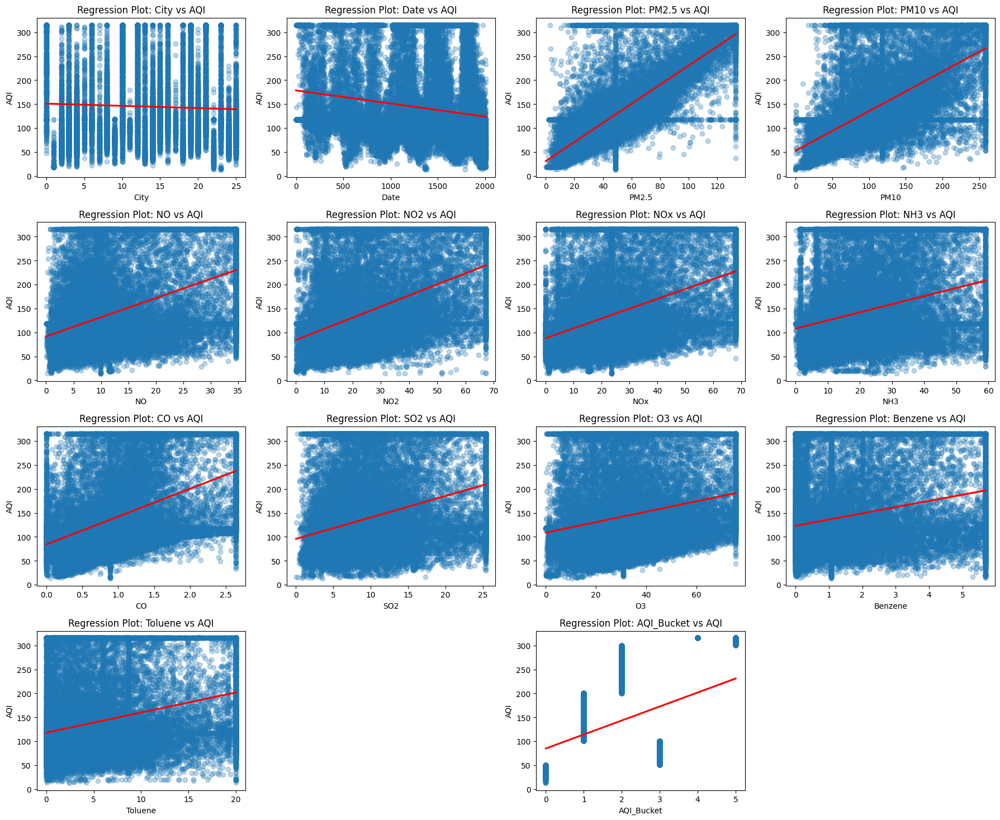

In [31]:
# Regression plot
plt.figure(figsize=(18, 18))
for i, col in enumerate(numeric_cols):
    if col != 'AQI':
        plt.subplot(5, 4, i + 1)
        sns.regplot(x=df[col], y=df['AQI'], scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'})
        plt.xlabel(col)
        plt.ylabel('AQI')
        plt.title(f'Regression Plot: {col} vs AQI')
plt.tight_layout()
plt.show()

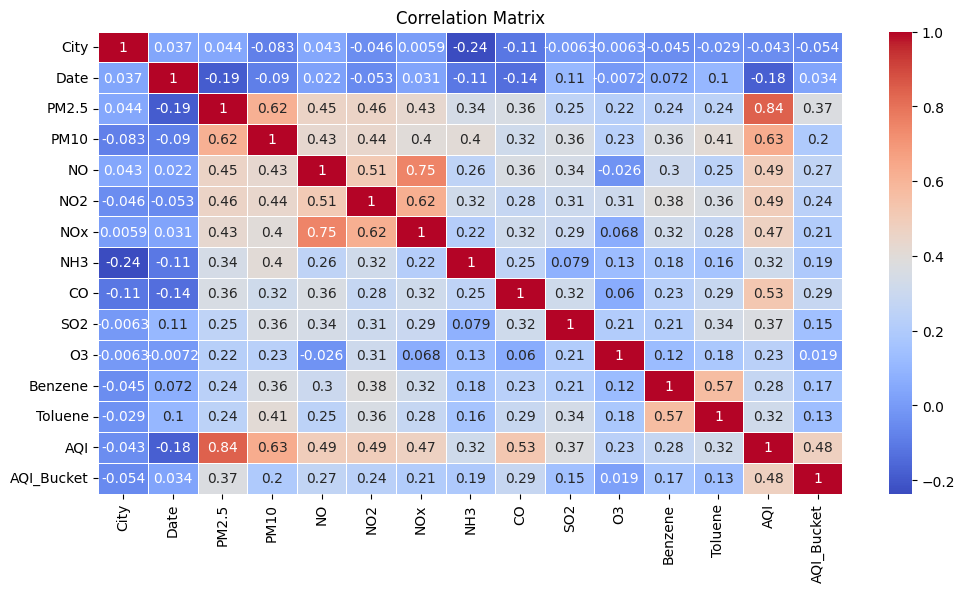

In [32]:
# Heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

***Multivariate Analysis***

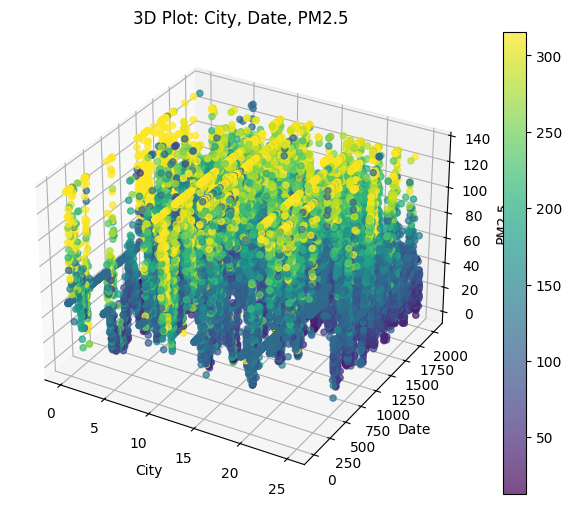

In [35]:
# 3D Scatter Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

cols_for_3d = list(combinations(numeric_cols, 3))[:1]
for col1, col2, col3 in cols_for_3d:
    sc = ax.scatter(df[col1], df[col2], df[col3], c=df['AQI'], cmap='viridis', alpha=0.7)
    ax.set_xlabel(col1)
    ax.set_ylabel(col2)
    ax.set_zlabel(col3)
    ax.set_title(f'3D Plot: {col1}, {col2}, {col3}')

plt.colorbar(sc)
plt.show()

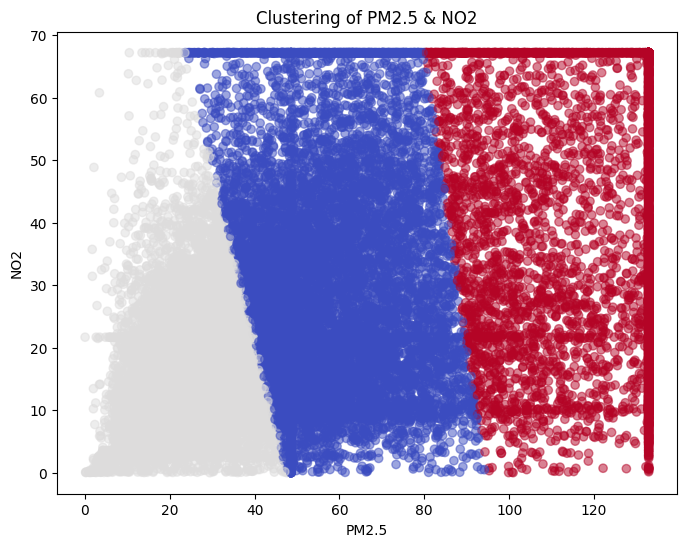

In [36]:
# Clustering by K-Means
selected_features = df[['PM2.5', 'NO2']].dropna()
kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(selected_features)

plt.figure(figsize=(8, 6))
plt.scatter(selected_features.iloc[:, 0], selected_features.iloc[:, 1], c=clusters, cmap='coolwarm', alpha=0.5)
plt.xlabel('PM2.5')
plt.ylabel('NO2')
plt.title('Clustering of PM2.5 & NO2')
plt.show()

#***Final report***

📊 Comprehensive Air Quality Analysis (EDA)
🚀 Advanced Air Quality Analysis in India Using EDA & Machine Learning
In this project, we performed an in-depth Exploratory Data Analysis (EDA) on an air quality dataset to understand the key factors influencing AQI (Air Quality Index). Our approach involved data cleaning, outlier detection, advanced visualizations, and statistical analysis using Python, Pandas, Seaborn, Matplotlib, and Scikit-learn.

🔹 1. Data Cleaning & Preprocessing
✅ 📥 Importing Libraries & Dataset
python
Copy
Edit
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
✔️ Loaded the dataset and analyzed missing values.
✔️ Converted categorical columns (e.g., city names) into numeric format using Label Encoding.
✔️ Handled missing numerical values using Mean Imputation.
✔️ Identified and treated outliers using Tukey’s Method and IQR-based filtering.

🔹 2. Exploratory Data Analysis (EDA)
📌 Univariate Analysis
✔️ We used Density Plots, Box Plots, Violin Plots, and Q-Q Plots to analyze the distribution of variables.
✔️ High pollution spikes were observed in PM2.5, PM10, NO2, and AQI, indicating periods of severe pollution.

📊 Example: PM2.5 Distribution

python
Copy
Edit
sns.kdeplot(df['PM2.5'], fill=True, color='royalblue')
plt.title('Density Plot of PM2.5')
plt.show()
📌 Bivariate Analysis
✔️ Pair Plots, Regression Plots, and Heatmaps were used to analyze relationships between variables.
✔️ PM2.5 and PM10 showed a strong positive correlation, meaning they likely originate from the same pollution sources.
✔️ AQI is strongly influenced by NO2 and NOx levels, suggesting nitrogen oxides significantly impact air quality.

📊 Example: Correlation Heatmap

python
Copy
Edit
plt.figure(figsize=(12, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()
📌 Multivariate Analysis
✔️ 3D Scatter Plots and Clustering (K-Means) were applied to uncover hidden patterns.
✔️ The clustering results showed that highly polluted cities tend to exhibit similar levels of PM2.5, NO2, and CO.

📊 Example: K-Means Clustering

python
Copy
Edit
from sklearn.cluster import KMeans

selected_features = df[['PM2.5', 'NO2']].dropna()
kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(selected_features)

plt.figure(figsize=(8, 6))
plt.scatter(selected_features.iloc[:, 0], selected_features.iloc[:, 1], c=clusters, cmap='coolwarm', alpha=0.5)
plt.xlabel('PM2.5')
plt.ylabel('NO2')
plt.title('Clustering of PM2.5 & NO2')
plt.show()
🔹 3. Key Challenges & Findings
📌 Challenges Faced:
✔️ 16% missing values in AQI_Bucket, handled using Imputation.
✔️ Extreme outliers in pollution levels, requiring careful data preprocessing.
✔️ Strong correlations between variables, allowing for dimensionality reduction.

📌 Major Findings:
✔️ AQI is heavily influenced by PM2.5, NO2, and NOx levels.
✔️ High-pollution cities share similar contamination patterns, making it possible to predict AQI effectively.
✔️ Using clustering, we classified regions into three pollution groups, which can guide environmental policies.

🔹 4. Conclusion & Next Steps
✅ We successfully explored and visualized key air pollution factors using advanced EDA techniques.
✅ These insights can be used to build AI-powered predictive models for air pollution forecasting.
✅ Next, we will develop a Machine Learning model to predict AQI levels using deep learning techniques.